**bold text**# Practical Lecture

In [ ]:
%cd /content/drive/My\ Drive/lab

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
import cv2 as cv
import random
from torchvision import models, transforms
import PIL

# Part A: Visualizing CNNs

## Load the pre-trained VGG-16 Model

We will load the VGG-16 model from `torchvision.models` module.

In [ ]:
# load the pretrained VGG-16 model for image classification
model = models.vgg16(pretrained=True)
# don't need to find gradients with respect to the prams of the network
for param in model.parameters():
    param.requires_grad = False
print(model)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth



VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=

## Acessing the Convolutional Layers and Their Weights

In [ ]:
# we will save the conv layer weights in this list
model_weights = []
# we will save the conv layers in this list
conv_layers = []
# get all the model children as list
model_children = list(model.children())
print(model_children)
# counter to keep count of the conv layers
counter = 0 
# append all the conv layers and their respective weights to the list
for child in model_children:
  if type(child)==nn.Conv2d:
    counter+=1
    model_weights.append(child.weight)
    conv_layers.append(child)
  elif type(child)==nn.Sequential:
    for layer in child.children():
      if type(layer)==nn.Conv2d:
        counter+=1
        conv_layers.append(layer)
        model_weights.append(layer.weight)
print(f"Total convolutional layers: {counter}")

[Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_s

## Visualizing Convolutional Layer Filters

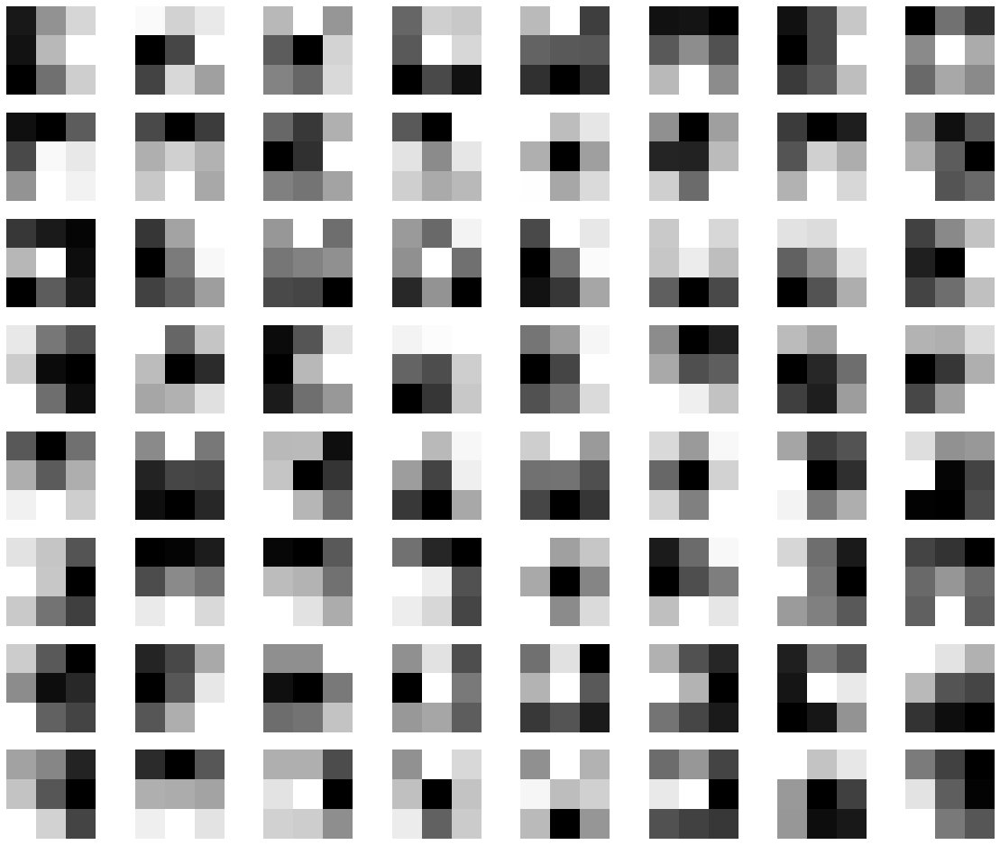

In [ ]:
# visualize the first conv layer filters
plt.figure(figsize=(20, 17))
for i, filter in enumerate(model_weights[0]):
    # (8, 8) because in conv0 we have total of 64 filters (see printed shapes)
    plt.subplot(8, 8, i+1) 
    plt.imshow(filter[0, :, :].detach(), cmap='gray')
    plt.axis('off')
plt.show()

## Reading the Image

In [ ]:
def load_imagenet_val(num=None):
  imagenet_fn = 'imagenet_val_25.npz'
  f = np.load(imagenet_fn, allow_pickle=True)
  X = f['X']
  y = f['y']
  class_names = f['label_map'].item()
  if num is not None:
    X = X[:num]
    y = y[:num]
  return X, y, class_names

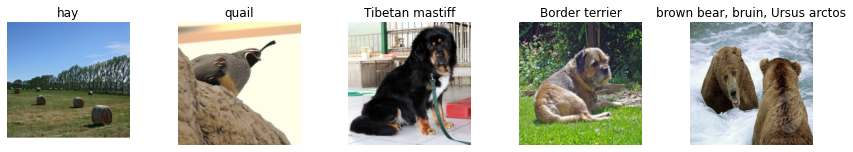

In [ ]:
X_raw, y, class_names = load_imagenet_val(num=5)

plt.figure(figsize=(12, 6))
for i in range(5):
    plt.subplot(1, 5, i + 1)
    plt.imshow(X_raw[i])
    plt.title(class_names[y[i]])
    plt.axis('off')
plt.gcf().tight_layout()

## Defining the Transforms
Since the VGG-16 network is trained with preprocessed images, we need to define the same transforms to visualize the correct feature maps.

In [ ]:
def rescale(x):
  low, high = x.min(), x.max()
  x_rescaled = (x - low) / (high - low)
  return x_rescaled

def preprocess(image, size = 224):
  transform = transforms.Compose([
      transforms.ToPILImage(),
      transforms.Resize(size),
      transforms.ToTensor(),
      transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
      transforms.Lambda(lambda x: x[None]),
  ])
  return transform(image)

def deprocess(image):
  transform = transforms.Compose([
      transforms.Lambda(lambda x: x[0]),
      transforms.Normalize(mean=[0, 0, 0], std=[4.3668, 4.4643, 4.4444]),
      transforms.Normalize(mean=[-0.485, -0.456, -0.406], std=[1, 1, 1]),
      transforms.Lambda(rescale),
      transforms.ToPILImage(),
  ])
  return transform(image)

## Forward propagate and save feature maps

In [ ]:
# preprocess the raw images
imgs = [preprocess(X_raw[i]) for i in range(len(X_raw))]
# get first layer feature maps
results = [conv_layers[0](imgs[1])]
# use a for loop to obtain all the feature maps
for i in range(1, len(conv_layers)):
    results.append(conv_layers[i](results[-1]))
outputs = results

## Visualizing the Feature Maps

Layer  1


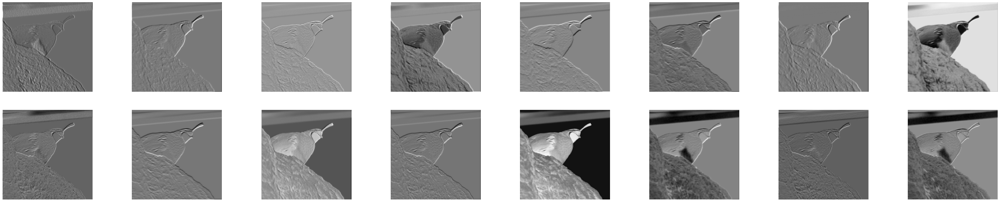

Layer  2


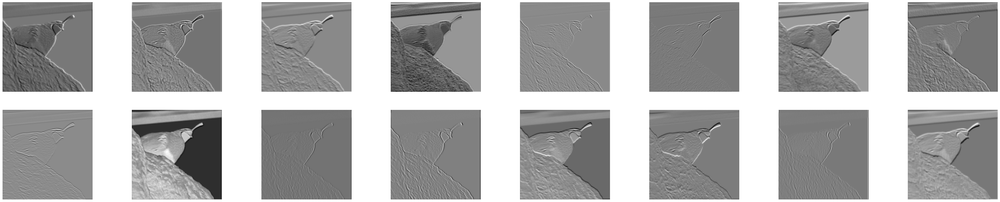

Layer  3


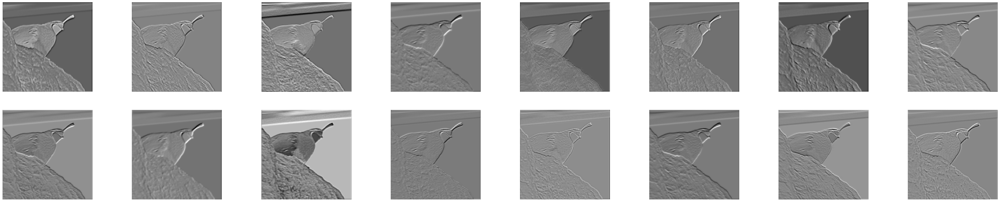

Layer  4


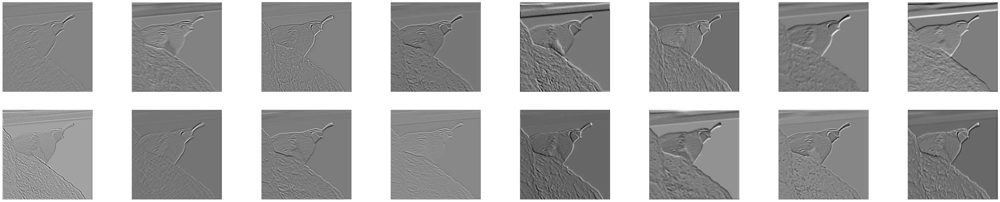

Layer  5


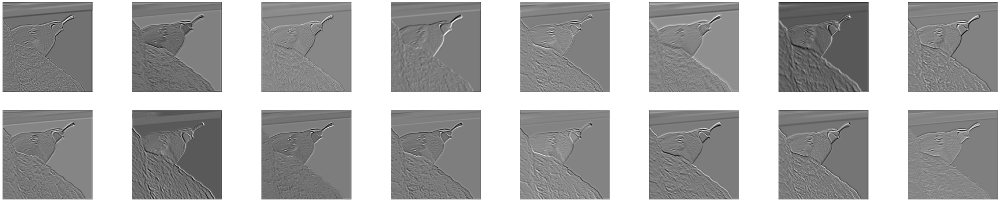

Layer  6


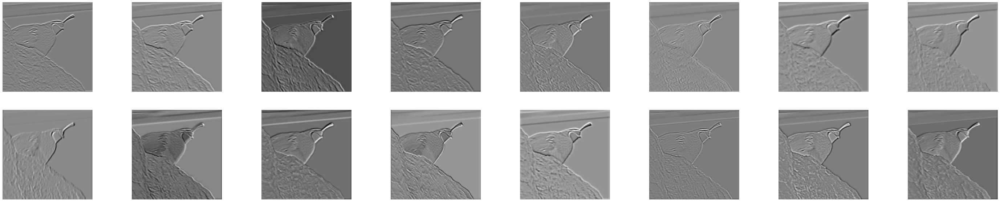

Layer  7


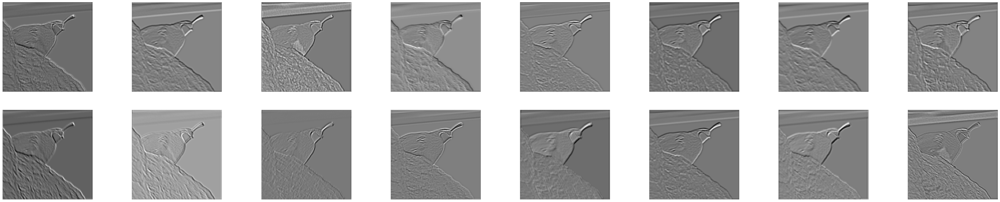

Layer  8


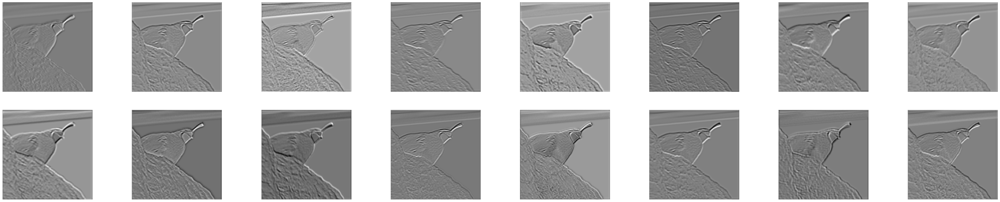

Layer  9


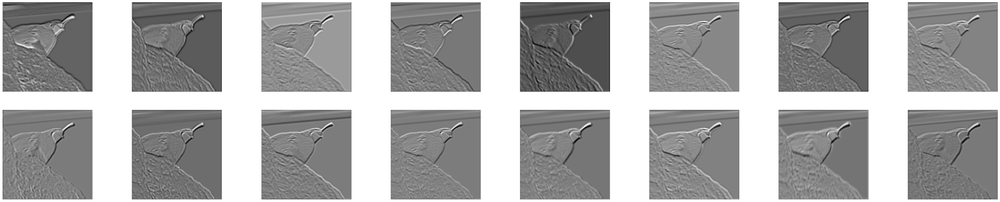

Layer  10


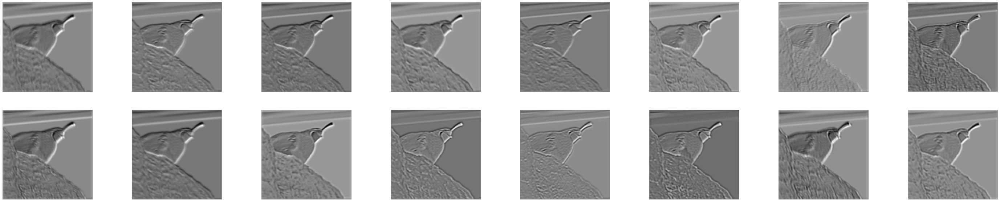

Layer  11


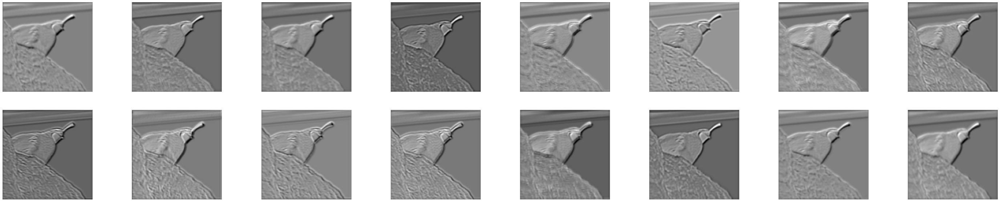

Layer  12


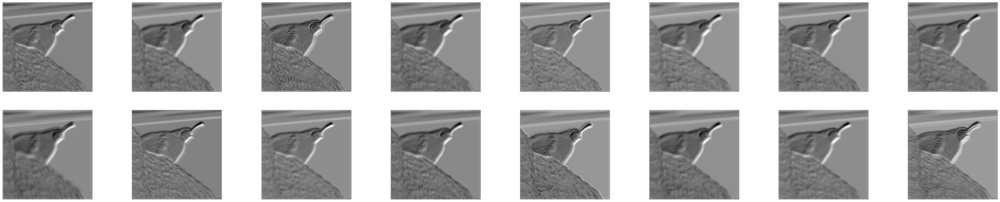

Layer  13


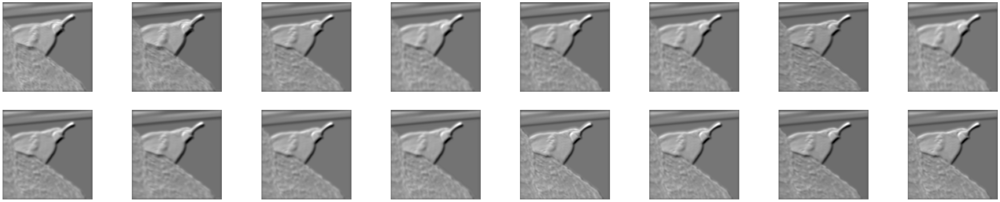

In [ ]:
for num_layer in range(len(outputs)):
    plt.figure(figsize=(50, 10))
    layer_viz = outputs[num_layer][0, :, :, :]
    layer_viz = layer_viz.data
    print("Layer ",num_layer+1)
    for i, filter in enumerate(layer_viz):
      # in this example, we only print the first 16 feature maps in each layer
      if i == 16: 
          break
      plt.subplot(2, 8, i + 1)
      plt.imshow(filter, cmap='gray')
      plt.axis("off")
    plt.show()
    plt.close()

# Part B: Understanding CNNs

## Saliency Maps
Using this pretrained model, we will compute class saliency maps as described in Section 3.1 of [1].

A **saliency map** tells us the degree to which each pixel in the image affects the classification score for that image. To compute it, we compute the gradient of the unnormalized score corresponding to the correct class (which is a scalar) with respect to the pixels of the image. If the image has shape `(3, H, W)` then this gradient will also have shape `(3, H, W)`; for each pixel in the image, this gradient tells us the amount by which the classification score will change if the pixel changes by a small amount. To compute the saliency map, we take the absolute value of this gradient, then take the maximum value over the 3 input channels; the final saliency map thus has shape `(H, W)` and all entries are nonnegative.

[1] Karen Simonyan, Andrea Vedaldi, and Andrew Zisserman. "Deep Inside Convolutional Networks: Visualising
Image Classification Models and Saliency Maps", ICLR Workshop 2014.

### PyTorch `gather` method
In Numpy when you need to select one element from each row of a matrix; if `s` is an numpy array of shape `(N, C)` and `y` is a numpy array of shape `(N,`) containing integers `0 <= y[i] < C`, then `s[np.arange(N), y]` is a numpy array of shape `(N,)` which selects one element from each element in `s` using the indices in `y`.

In PyTorch you can perform the same operation using the `gather()` method. If `s` is a PyTorch Tensor of shape `(N, C)` and `y` is a PyTorch Tensor of shape `(N,)` containing longs in the range `0 <= y[i] < C`, then

`s.gather(1, y.view(-1, 1)).squeeze()`

will be a PyTorch Tensor of shape `(N,)` containing one entry from each row of `s`, selected according to the indices in `y`.

run the following cell to see an example.

You can also read the documentation for [the gather method](http://pytorch.org/docs/torch.html#torch.gather)
and [the squeeze method](http://pytorch.org/docs/torch.html#torch.squeeze).

In [ ]:
def compute_saliency_maps(X, y, model):
  """
  Compute a class saliency map using the model for images X and labels y.

  Input:
  - X: Input images; Tensor of shape (N, 3, H, W)
  - y: Labels for X; LongTensor of shape (N,)
  - model: A pretrained CNN that will be used to compute the saliency map.

  Returns:
  - saliency: A Tensor of shape (N, H, W) giving the saliency maps for the input
  images.
  """
  # Make sure the model is in "test" mode
  model.eval()

  # Make input tensor require gradient
  X.requires_grad_()

  saliency = None
  ##############################################################################
  # TODO: Implement this function. Perform a forward and backward pass through #
  # the model to compute the gradient of the correct class score with respect  #
  # to each input image. You first want to compute the loss over the correct   #
  # scores (we'll combine losses across a batch by summing), and then compute  #
  # the gradients with a backward pass.                                        #
  ##############################################################################
  # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

  scores = model(X)
  
  scores = scores.gather(1, y.view(-1, 1)).squeeze()

  #backward pass
  scores.backward(torch.FloatTensor([1.0]*scores.shape[0]))
    
  #saliency
  saliency, _ = torch.max(X.grad.data.abs(), dim=1)

  # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
  ##############################################################################
  #                             END OF YOUR CODE                               #
  ##############################################################################
  return saliency

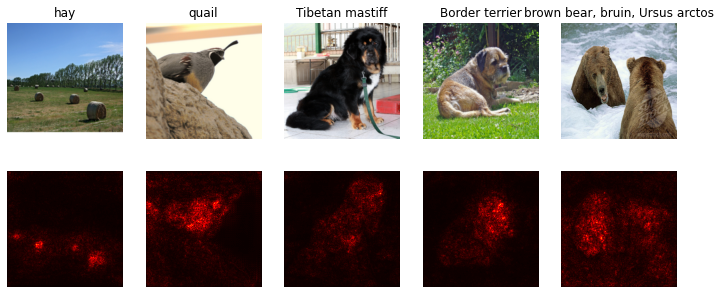

In [ ]:
def show_saliency_maps(X, y):
    # Convert X and y from numpy arrays to Torch Tensors
    X_tensor = torch.cat([preprocess(x) for x in X], dim=0)

    y_tensor = torch.LongTensor(y)
    
    # Compute saliency maps for images in X
    saliency = compute_saliency_maps(X_tensor, y_tensor, model)

    # Convert the saliency map from Torch Tensor to numpy array and show images
    # and saliency maps together.
    saliency = saliency.numpy()
    N = X.shape[0]
    for i in range(N):
        plt.subplot(2, N, i + 1)
        plt.imshow(X[i])
        plt.axis('off')
        plt.title(class_names[y[i]])
        plt.subplot(2, N, N + i + 1)
        plt.imshow(saliency[i], cmap=plt.cm.hot)
        plt.axis('off')
        plt.gcf().set_size_inches(12, 5)
    plt.show()

show_saliency_maps(X_raw, y)

## Fooling Images
We can also use image gradients to generate "fooling images" as discussed in [2]. Given an image and a target class, we can perform gradient **ascent** over the image to maximize the target class, stopping when the network classifies the image as the target class. Implement the following function to generate fooling images.

[2] Szegedy et al, "Intriguing properties of neural networks", ICLR 2014

In [ ]:
def make_fooling_image(X, target_y, model):
  """
  Generate a fooling image that is close to X, but that the model classifies
  as target_y.

  Inputs:
  - X: Input image; Tensor of shape (1, 3, 224, 224)
  - target_y: An integer in the range [0, 1000)
  - model: A pretrained CNN

  Returns:
  - X_fooling: An image that is close to X, but that is classifed as target_y
  by the model.
  """
  # Initialize our fooling image to the input image, and make it require gradient
  X_fooling = X.clone()
  X_fooling = X_fooling.requires_grad_()
  
  learning_rate = 1
  ##############################################################################
  # TODO: Generate a fooling image X_fooling that the model will classify as   #
  # the class target_y. You should perform gradient ascent on the score of the #
  # target class, stopping when the model is fooled.                           #
  # When computing an update step, first normalize the gradient:               #
  #   dX = learning_rate * g / ||g||_2                                         #
  #                                                                            #
  # You should write a training loop.                                          #
  #                                                                            #
  # HINT: For most examples, you should be able to generate a fooling image    #
  # in fewer than 100 iterations of gradient ascent.                           #
  # You can print your progress over iterations to check your algorithm.       #
  ##############################################################################
  while True:
      scores = model(X_fooling)
      _, idx = torch.max(scores, 1)
      if (idx != target_y):
          scores[:,target_y].backward()
          dX = learning_rate*X_fooling.grad.data/torch.norm(X_fooling.grad.data)
          X_fooling.data += dX.data
          X_fooling.grad.data.zero_()
      else:
          break 
  ##############################################################################
  #                             END OF YOUR CODE                               #
  ##############################################################################
  return X_fooling

In [ ]:
def make_fooling_image(X, target_y, model):
  """
  Generate a fooling image that is close to X, but that the model classifies
  as target_y.
  Inputs:
  - X: Input image; Tensor of shape (1, 3, 224, 224)
  - target_y: An integer in the range [0, 1000)
  - model: A pretrained CNN
  Returns:
  - X_fooling: An image that is close to X, but that is classifed as target_y
  by the model.
  """
  # Initialize our fooling image to the input image, and make it require gradient
  X_fooling = X.clone()
  X_fooling = X_fooling.requires_grad_()
  learning_rate = 1
  while True:
      scores = model(X_fooling)
      _, idx = torch.max(scores, 1)
      if (idx != target_y):
          scores[:,target_y].backward()
          dX = learning_rate*X_fooling.grad.data/torch.norm(X_fooling.grad.data)
          X_fooling.data += dX.data
          X_fooling.grad.data.zero_()
      else:
          break 
  return X_fooling

In [ ]:
idx = 3
target_y = 6

X_tensor = torch.cat([preprocess(x) for x in X_raw], dim=0)
X_fooling = make_fooling_image(X_tensor[idx:idx+1], target_y, model)

scores = model(X_fooling)
assert target_y == scores.data.max(1)[1][0].item(), 'The model is not fooled!'

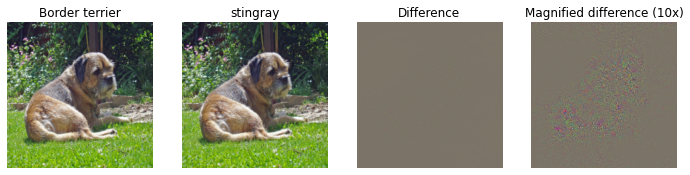

In [ ]:
X_fooling_np = deprocess(X_fooling.clone())
X_fooling_np = np.asarray(X_fooling_np).astype(np.uint8)

plt.subplot(1, 4, 1)
plt.imshow(X_raw[idx])
plt.title(class_names[y[idx]])
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(X_fooling_np)
plt.title(class_names[target_y])
plt.axis('off')

plt.subplot(1, 4, 3)
X_pre = preprocess(X_raw[idx])
diff = np.asarray(deprocess(X_fooling - X_pre))
plt.imshow(diff)
plt.title('Difference')
plt.axis('off')

plt.subplot(1, 4, 4)
diff = np.asarray(deprocess(10 * (X_fooling - X_pre)))
plt.imshow(diff)
plt.title('Magnified difference (10x)')
plt.axis('off')

plt.gcf().set_size_inches(12, 5)
plt.show()

## Class Visualization
By starting with a random noise image and performing gradient ascent on a target class, we can generate an image that the network will recognize as the target class. This idea was first presented in [2]; [3] extended this idea by suggesting several regularization techniques that can improve the quality of the generated image.

Concretely, let $I$ be an image and let $y$ be a target class. Let $s_y(I)$ be the score that a convolutional network assigns to the image $I$ for class $y$; note that these are raw unnormalized scores, not class probabilities. We wish to generate an image $I^*$ that achieves a high score for the class $y$ by solving the problem

$$
I^* = \arg\max_I (s_y(I) - R(I))
$$

where $R$ is a (possibly implicit) regularizer (note the sign of $R(I)$ in the argmax: we want to minimize this regularization term). We can solve this optimization problem using gradient ascent, computing gradients with respect to the generated image. We will use (explicit) L2 regularization of the form

$$
R(I) = \lambda \|I\|_2^2
$$

**and** implicit regularization as suggested by [3] by periodically blurring the generated image. We can solve this problem using gradient ascent on the generated image.

[2] Karen Simonyan, Andrea Vedaldi, and Andrew Zisserman. "Deep Inside Convolutional Networks: Visualising
Image Classification Models and Saliency Maps", ICLR Workshop 2014.

[3] Yosinski et al, "Understanding Neural Networks Through Deep Visualization", ICML 2015 Deep Learning Workshop

In [ ]:
def jitter(X, ox, oy):
  """
  Helper function to randomly jitter an image.
  Don't change this function  
  Inputs
  - X: PyTorch Tensor of shape (N, C, H, W)
  - ox, oy: Integers giving number of pixels to jitter along W and H axes
  
  Returns: A new PyTorch Tensor of shape (N, C, H, W)
  """
  if ox != 0:
      left = X[:, :, :, :-ox]
      right = X[:, :, :, -ox:]
      X = torch.cat([right, left], dim=3)
  if oy != 0:
      top = X[:, :, :-oy]
      bottom = X[:, :, -oy:]
      X = torch.cat([bottom, top], dim=2)
  return X

from scipy.ndimage.filters import gaussian_filter1d
def blur_image(X, sigma=1):
  X_np = X.cpu().clone().numpy()
  X_np = gaussian_filter1d(X_np, sigma, axis=2)
  X_np = gaussian_filter1d(X_np, sigma, axis=3)
  X.copy_(torch.Tensor(X_np).type_as(X))
  return X

**Task**: Complete the missing code in the `create_class_visualization` function



In [ ]:
def create_class_visualization(target_y, model, dtype, **kwargs):
  """
  Generate an image to maximize the score of target_y under a pretrained model.
  
  Inputs:
  - target_y: Integer in the range [0, 1000) giving the index of the class
  - model: A pretrained CNN that will be used to generate the image
  - dtype: Torch datatype to use for computations
  
  Keyword arguments:
  - l2_reg: Strength of L2 regularization on the image
  - learning_rate: How big of a step to take
  - num_iterations: How many iterations to use
  - blur_every: How often to blur the image as an implicit regularizer
  - max_jitter: How much to gjitter the image as an implicit regularizer
  - show_every: How often to show the intermediate result
  """
  mean = [-0.485, -0.456, -0.406]
  std = [1/0.229, 1/0.224, 1/0.225]
  
  model.type(dtype)
  l2_reg = kwargs.pop('l2_reg', 1e-3)
  learning_rate = kwargs.pop('learning_rate', 25)
  num_iterations = kwargs.pop('num_iterations', 500)
  blur_every = kwargs.pop('blur_every', 10)
  max_jitter = kwargs.pop('max_jitter', 16)
  show_every = kwargs.pop('show_every', 100)

  # Randomly initialize the image as a PyTorch Tensor, and make it requires gradient.
  img = torch.randn(1, 3, 224, 224).mul_(1.0).type(dtype).requires_grad_()

  for t in range(num_iterations):
      # Randomly jitter the image a bit; this gives slightly nicer results
      ox, oy = random.randint(0, max_jitter), random.randint(0, max_jitter)
      img.data.copy_(jitter(img.data, ox, oy))

      ########################################################################
      # TODO: Use the model to compute the gradient of the score for the     #
      # class target_y with respect to the pixels of the image, and make a   #
      # gradient step on the image using the learning rate. Don't forget the #
      # L2 regularization term!                                              #
      # Be very careful about the signs of elements in your code.            #
      ########################################################################
      scores = model(img)
      score = scores[:,target_y] - (l2_reg * torch.norm(img))
      score.backward()
      img.data += (learning_rate*img.grad.data/torch.norm(img.grad.data))
      img.grad.data.zero_()
      ########################################################################
      #                             END OF YOUR CODE                         #
      ########################################################################
      
      # Undo the random jitter
      img.data.copy_(jitter(img.data, -ox, -oy))

      # As regularizer, clamp and periodically blur the image
      for c in range(3):
          lo = float(mean[c]*std[c])
          hi = float((1.0 + mean[c])*std[c])
          img.data[:, c].clamp_(min=lo, max=hi)
      if t % blur_every == 0:
          blur_image(img.data, sigma=0.5)
      
      # Periodically show the image
      if t == 0 or (t + 1) % show_every == 0 or t == num_iterations - 1:
          plt.imshow(deprocess(img.data.clone().cpu()))
          class_name = class_names[target_y]
          plt.title('%s\nIteration %d / %d' % (class_name, t + 1, num_iterations))
          plt.gcf().set_size_inches(4, 4)
          plt.axis('off')
          plt.show()

  return deprocess(img.data.cpu())

Try out your class visualization on different classes! You should also feel free to play with various hyperparameters to try and improve the quality of the generated image, but this is not required.

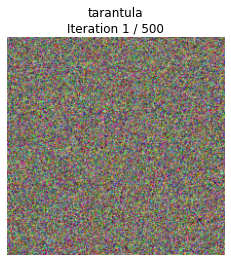

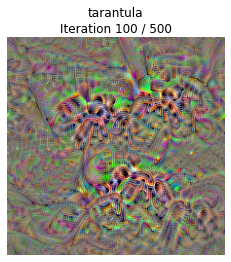

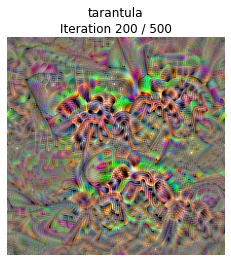

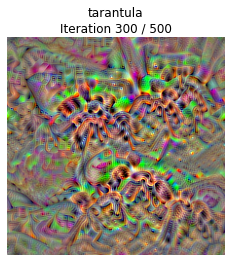

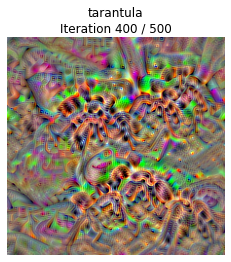

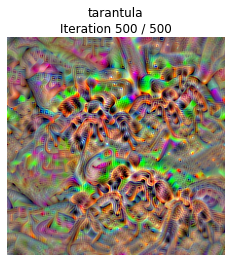

In [ ]:
# dtype = torch.FloatTensor
dtype = torch.cuda.FloatTensor # Uncomment this to use GPU
model.type(dtype)

target_y = 76 # Tarantula
# target_y = 78 # Tick
#target_y = 187 # Yorkshire Terrier
# target_y = 683 # Oboe
# target_y = 366 # Gorilla
# target_y = 604 # Hourglass
out = create_class_visualization(target_y, model, dtype)